In [2]:
import pandas as pd
import numpy as np
import os
import pickle
import sklearn
from sklearn.base import BaseEstimator

from sklearn.model_selection import train_test_split
from sklearn.pipeline import Pipeline

import xgboost
import lightgbm

import shap
import lime
import lime.lime_tabular
from lime import submodular_pick

import operator

import matplotlib.pyplot as plt

In [15]:
class ShapObject:
    
    def __init__(self, base_values, data, values, feature_names):
        self.base_values = base_values # Single value
        self.data = data # Raw feature values for 1 row of data
        self.values = values # SHAP values for the same row of data
        self.feature_names = feature_names # Column names
        
class Preprocessor(BaseEstimator):
    
    def transform(self, df: pd.DataFrame, col_names: list = None) -> pd.DataFrame:
        if not isinstance(df, pd.DataFrame):
            df = pd.DataFrame(df, columns=col_names)

        cols_to_diff = [
        ['PAY_0', 'PAY_2', 'PAY_3', 'PAY_4', 'PAY_5', 'PAY_6'],
        ['BILL_AMT1', 'BILL_AMT2', 'BILL_AMT3',
         'BILL_AMT4', 'BILL_AMT5', 'BILL_AMT6']
        ]
        res_list = []

        for cols in cols_to_diff:
            diff_df = df[cols].diff(axis=1).iloc[:, 1:]
            diff_df.columns = [f'{col}_DIFF' for col in diff_df.columns]
            res_list.append(diff_df)

        df = pd.concat(
            [df, *res_list],
            axis=1
        )

        return df
    
    def fit_transform(self, df: pd.DataFrame) -> pd.DataFrame:
        return self.transform(df)

In [10]:
DATA_PATH = os.path.join("data", "credit_card_default_analysis.csv")
TEST_DATA_PATH = os.path.join("data", "test_dataset.csv")
TRAIN_DATA_PATH = os.path.join("data", "train_dataset.csv")
LGBM_PATH = os.path.join("src", "models", "trained", "lgbm_clf.pkl")
LOGREG_PATH = os.path.join("src", "models", "trained", "log_reg_v1.pkl")
CATEGORICAL_FEATURE = ['EDUCATION', 'SEX', 'MARRIAGE']
CLASS_NAMES = ['NO', 'YES']
RND_SEED = 1

In [5]:
np.random.seed(RND_SEED)

In [6]:
dataset = pd.read_csv(DATA_PATH, index_col='ID')
# df.drop(columns='default', inplace=True)
feature_names = list(dataset.columns)
categorical_features_indices = [feature_names.index(feature_name) for feature_name in CATEGORICAL_FEATURE]
dataset.head()

,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,PAY_5,...,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,default
ID,,,,,,,,,,,,,,,,,,,,,
1,20000,2,2,1,24,2,2,0,0,0,...,0,0,0,0,689,0,0,0,0,1
2,120000,2,2,2,26,0,2,0,0,0,...,3272,3455,3261,0,1000,1000,1000,0,2000,1
3,90000,2,2,2,34,0,0,0,0,0,...,14331,14948,15549,1518,1500,1000,1000,1000,5000,0
4,50000,2,2,1,37,0,0,0,0,0,...,28314,28959,29547,2000,2019,1200,1100,1069,1000,0
5,50000,1,2,1,57,0,0,0,0,0,...,20940,19146,19131,2000,36681,10000,9000,689,679,0


In [7]:
train_X, test_X, train_Y, test_Y = train_test_split(dataset.drop(["default"], axis=1), dataset.default, random_state=RND_SEED)
print(f"train_X.shape = {train_X.shape}")
print(f"train_Y.shape = {train_Y.shape}")
print(f"test_X.shape = {test_X.shape}")
print(f"test_Y.shape = {test_Y.shape}")

train_X.shape = (22500, 23)
train_Y.shape = (22500,)
test_X.shape = (7500, 23)
test_Y.shape = (7500,)


In [11]:
test_df = test_X.copy()
test_df['default'] = test_Y
test_df.to_csv(TEST_DATA_PATH)

train_df = train_X.copy()
train_df['default'] = train_Y
train_df.to_csv(TRAIN_DATA_PATH)

In [22]:
test_df = pd.read_csv(TEST_DATA_PATH, index_col='ID')
test_df

,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,PAY_5,...,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,default
ID,,,,,,,,,,,,,,,,,,,,,
10748,310000,1,3,1,32,0,0,0,0,0,...,84373,57779,14163,8295,6000,4000,3000,1000,2000,0
12574,10000,2,3,1,49,0,0,0,0,2,...,1690,1138,930,0,0,2828,0,182,0,1
29677,50000,1,2,1,28,0,0,0,0,0,...,45975,1300,43987,0,46257,2200,1300,43987,1386,0
8857,80000,2,3,1,52,2,2,3,3,3,...,40748,39816,40607,3700,1600,1600,0,1600,1600,1
21099,270000,1,1,2,34,1,2,0,0,2,...,22448,15490,17343,0,4000,2000,0,2000,2000,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
29318,30000,1,3,2,26,0,0,0,0,0,...,18972,28051,20782,2000,2000,1600,10000,2140,0,0
18630,50000,2,1,2,26,0,0,0,0,0,...,20090,20334,20856,1600,1700,1800,875,1000,4700,0
15330,390000,2,1,2,33,0,0,0,0,0,...,0,1560,4386,1017,0,0,1560,4386,12000,0


In [23]:
lgbm_preproc = Preprocessor()
proc_data = lgbm_preproc.transform(test_df.drop(['default'], axis=1))
labels = test_df.default

## 3. Применение SHAP

### 3.1. Сравнить важность признаков, получаемую с помощью SHAP с важностью признаков, получаемую с помощью модели на основе ансамбля деревьев решений

In [ ]:
explainer = shap.Explainer(lgbm_model, proc_data.to_numpy(), feature_names=feature_names)
shap_values = explainer.shap_values(proc_data.to_numpy())
shap.summary_plot(shap_values, proc_data.to_numpy(), feature_names)

## Lime

### LightBGM

In [24]:
with open(LGBM_PATH, 'rb') as file:
    lgbm_model = pickle.load(file)

In [25]:
predicted_proba = lgbm_model.predict_proba(proc_data)
predicted_proba.shape

(7500, 2)

In [10]:
pred_proba_0 = pd.Series(predicted_proba[:, 0])
true_0_id = pred_proba_0.mask(labels != 0).argmax()
false_0_id = pred_proba_0.mask(labels != 1).argmax()
true_1_id = pred_proba_0.mask(labels != 1).argmin()
false_1_id = pred_proba_0.mask(labels != 0).argmin()
true_0_prob = predicted_proba[true_0_id, 0]
false_0_prob = predicted_proba[false_0_id, 0]
true_1_prob = predicted_proba[true_1_id, 1]
false_1_prob = predicted_proba[false_1_id, 1]
true_0 = proc_data.iloc[true_0_id, :]
false_0 = proc_data.iloc[false_0_id, :]
true_1 = proc_data.iloc[true_1_id, :]
false_1 = proc_data.iloc[false_1_id, :]

print(f"true_0_id: {true_0_id}, true_0 proba: {true_0_prob}")
print(f"true_1_id: {true_1_id}, true_1 proba: {true_1_prob}")
print(f"false_0_id: {false_0_id}, false_0 proba: {false_0_prob}")
print(f"false_1_id: {false_1_id}, false_1 proba: {false_1_prob}")

true_0_id: 23078, true_0 proba: 0.9671850829101816
true_1_id: 24155, true_1 proba: 0.9448243221032685
false_0_id: 17156, false_0 proba: 0.962446730265188
false_1_id: 20902, false_1 proba: 0.9448600619107248


In [11]:
explainer = lime.lime_tabular.LimeTabularExplainer(
    proc_data.to_numpy(), 
    feature_names = list(proc_data.columns), 
    class_names = CLASS_NAMES,                                               
    categorical_features = categorical_features_indices,                                                
    categorical_names = CATEGORICAL_FEATURE
)

In [12]:
n_explanations = 6

In [13]:
exp = explainer.explain_instance(true_0, lgbm_model.predict_proba, num_features=n_explanations)
exp.show_in_notebook(show_all=False)

In [14]:
exp = explainer.explain_instance(false_0, lgbm_model.predict_proba, num_features=n_explanations)
exp.show_in_notebook(show_all=False)

In [15]:
exp = explainer.explain_instance(true_1, lgbm_model.predict_proba, num_features=n_explanations)
exp.show_in_notebook(show_all=False)

In [16]:
exp = explainer.explain_instance(false_1, lgbm_model.predict_proba, num_features=n_explanations)
exp.show_in_notebook(show_all=False)

In [17]:
sp_obj = submodular_pick.SubmodularPick(
    explainer,
    proc_data.to_numpy(),
    lgbm_model.predict_proba,
    sample_size = 10,
    num_exps_desired = n_explanations,
    num_features=10
)

In [18]:
[exp.show_in_notebook(show_all=False) for exp in sp_obj.sp_explanations]

[None, None, None, None, None, None]

### LogReg

In [19]:
with open(LGBM_PATH, 'rb') as file:
    logreg_model = pickle.load(file)

In [20]:
logreg_model.predict_proba(proc_data)

array([[0.11459709, 0.88540291],
       [0.33631827, 0.66368173],
       [0.8107549 , 0.1892451 ],
       ...,
       [0.1589194 , 0.8410806 ],
       [0.51551952, 0.48448048],
       [0.49419204, 0.50580796]])

## SHAP

### LightGBM

In [27]:
predicted_proba = lgbm_model.predict_proba(proc_data)
predicted_proba.shape

(7500, 2)

In [23]:
pred_proba_0 = pd.Series(predicted_proba[:, 0])
true_0_id = pred_proba_0.mask(labels != 0).argmax()
false_0_id = pred_proba_0.mask(labels != 1).argmax()
true_1_id = pred_proba_0.mask(labels != 1).argmin()
false_1_id = pred_proba_0.mask(labels != 0).argmin()
true_0_prob = predicted_proba[true_0_id, 0]
false_0_prob = predicted_proba[false_0_id, 0]
true_1_prob = predicted_proba[true_1_id, 1]
false_1_prob = predicted_proba[false_1_id, 1]
true_0 = proc_data.iloc[true_0_id, :]
false_0 = proc_data.iloc[false_0_id, :]
true_1 = proc_data.iloc[true_1_id, :]
false_1 = proc_data.iloc[false_1_id, :]

print(f"true_0_id: {true_0_id}, true_0 proba: {true_0_prob}")
print(f"true_1_id: {true_1_id}, true_1 proba: {true_1_prob}")
print(f"false_0_id: {false_0_id}, false_0 proba: {false_0_prob}")
print(f"false_1_id: {false_1_id}, false_1 proba: {false_1_prob}")

true_0_id: 23078, true_0 proba: 0.9671850829101816
true_1_id: 24155, true_1 proba: 0.9448243221032685
false_0_id: 17156, false_0 proba: 0.962446730265188
false_1_id: 20902, false_1 proba: 0.9448600619107248


In [24]:
shap.initjs()
explainer = shap.Explainer(lgbm_model, proc_data.to_numpy(), feature_names=feature_names)
shap_values = explainer.shap_values(proc_data.to_numpy())
shap.force_plot(explainer.expected_value, shap_values[true_0_id, :], true_0, feature_names=feature_names)

 99%|===================| 29794/30000 [00:46<00:00]        

In [25]:
shap.initjs()
explainer = shap.Explainer(lgbm_model, proc_data.to_numpy(), feature_names=feature_names)
shap_values = explainer.shap_values(proc_data.to_numpy())
shap.force_plot(explainer.expected_value, shap_values[true_1_id, :], true_1, feature_names=feature_names)

 99%|===================| 29615/30000 [00:46<00:00]        

In [26]:
shap.initjs()
explainer = shap.Explainer(lgbm_model, proc_data.to_numpy(), feature_names=feature_names)
shap_values = explainer.shap_values(proc_data.to_numpy())
shap.force_plot(explainer.expected_value, shap_values[false_0_id, :], false_0, feature_names=feature_names)

 98%|===================| 29453/30000 [00:46<00:00]        

In [27]:
shap.initjs()
explainer = shap.Explainer(lgbm_model, proc_data.to_numpy(), feature_names=feature_names)
shap_values = explainer.shap_values(proc_data.to_numpy())
shap.force_plot(explainer.expected_value, shap_values[false_1_id, :], false_1, feature_names=feature_names)

100%|===================| 29937/30000 [00:47<00:00]        

We may also plot the Shapley values in the condenced form for all instances of a given dataset as it is done below.

In [28]:
shap.initjs()
exp_array =  shap.sample(proc_data, 100)
shap_values = explainer.shap_values(exp_array)
shap.force_plot(explainer.expected_value, shap_values, exp_array, feature_names=feature_names)

# Studing the feature importance

The plot below shows the Shapley values for features of a given dataset. The features are ordered by the sum of Shapley values starting from the largest one, i.e., by the attribute having the largest overall impact to the predictions.

The features like Race, Country, and Education are very close to 0, thus their Shapley values are almost 0's, and these features can be removed from the dataset.

 99%|===================| 29566/30000 [00:46<00:00]        

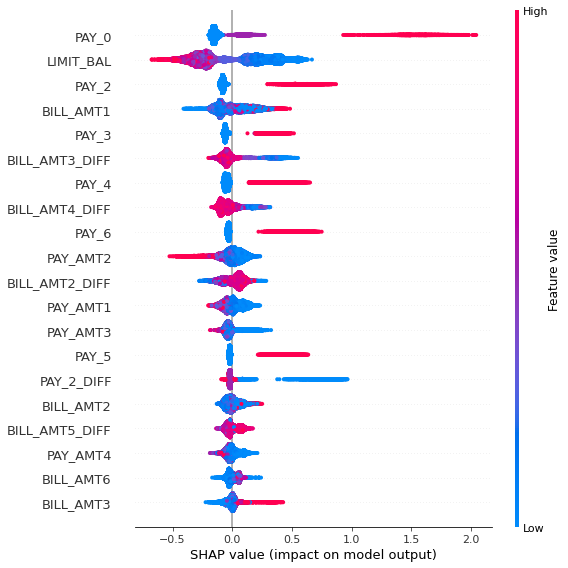

In [29]:
explainer = shap.Explainer(lgbm_model, proc_data.to_numpy(), feature_names=feature_names)
shap_values = explainer.shap_values(proc_data.to_numpy())
shap.summary_plot(shap_values, proc_data.to_numpy(), feature_names)

The same information can plotted in a more "usual" way, i.e., as the "feature importance" plot.

The barplot shows the mean Shapley values. The later is similar to the standard feature importance provided by tree-based ensembles.

 98%|===================| 29390/30000 [00:46<00:00]        

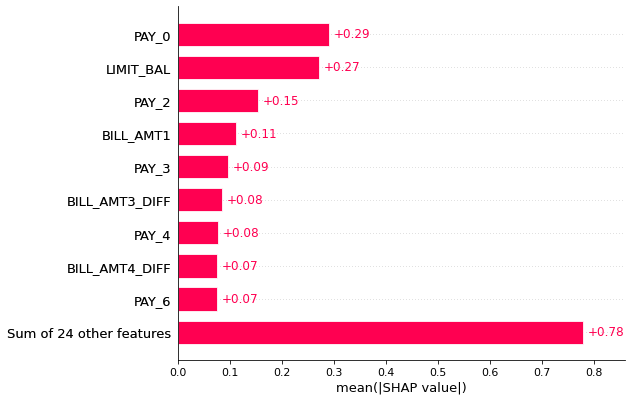

In [30]:
explainer = shap.Explainer(lgbm_model, proc_data.to_numpy(), feature_names=feature_names)
shap_values = explainer(proc_data.to_numpy())
shap.plots.bar(shap_values)

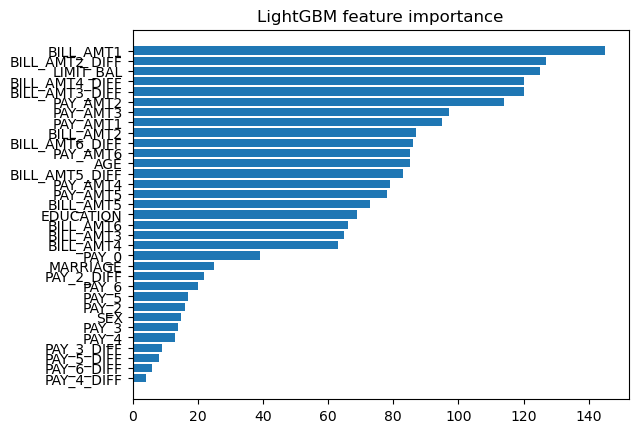

In [31]:
# feature importance for XGBoost classifier
feature_imp = {n:v for n,v in zip(feature_names, lgbm_model.feature_importances_.T)}
sorted_feature_imp = sorted(feature_imp.items(), key=operator.itemgetter(1))

plt.rcdefaults()
fig, ax = plt.subplots()

ax.barh(range(len(sorted_feature_imp)), [v[1] for v in sorted_feature_imp], align='center')
ax.set_yticks(range(len(sorted_feature_imp)))
ax.set_yticklabels([v[0] for v in sorted_feature_imp])
# ax.invert_yaxis()
ax.set_title('LightGBM feature importance')
plt.show()

 99%|===================| 29651/30000 [00:46<00:00]        

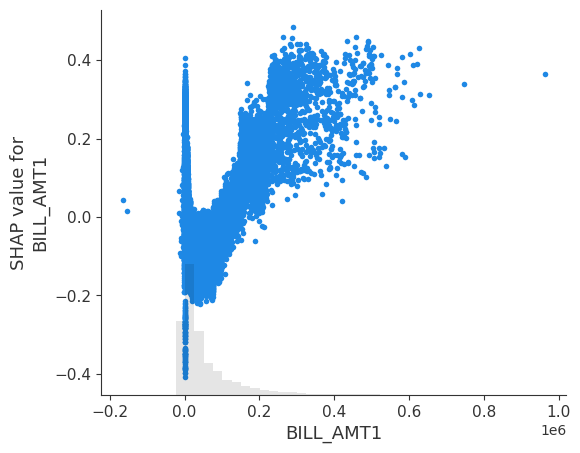

In [32]:
explainer = shap.Explainer(lgbm_model, proc_data.to_numpy(), feature_names=feature_names)
shap_values = explainer(proc_data.to_numpy())
shap.plots.scatter(shap_values[:, "BILL_AMT1"])

To show which feature may be driving these interaction effects we can color our Age dependence scatter plot by another feature. If you pass the 'Explanation object' to the color parameter then the scatter plot attempts to pick out the feature column with the strongest interaction with Age. If an interaction effect is present between this other feature and the feature we are plotting it will show up as a distinct vertical pattern of coloring. For the example below, 20-year-olds with a high level of education are less likely make over \$50k than 20-year-olds with a low level of education. This suggests an interaction effect between Education-Num and Age.



 99%|===================| 29752/30000 [00:47<00:00]        

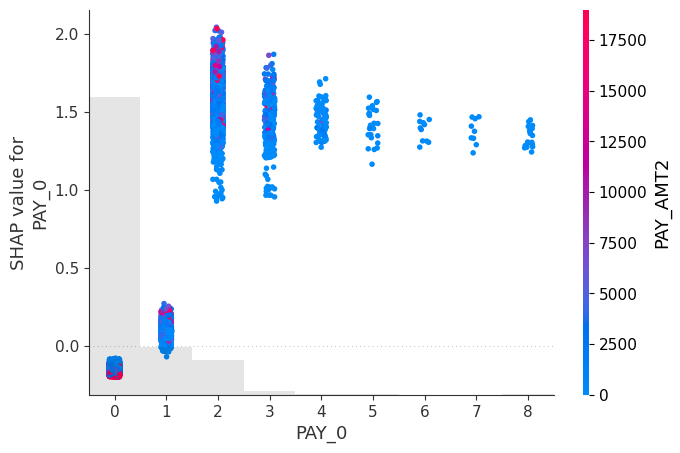

In [33]:
explainer = shap.Explainer(lgbm_model, proc_data.to_numpy(), feature_names=feature_names)
shap_values = explainer(proc_data.to_numpy())
shap.plots.scatter(shap_values[:,"PAY_0"], color=shap_values)

 99%|===================| 29701/30000 [00:46<00:00]        

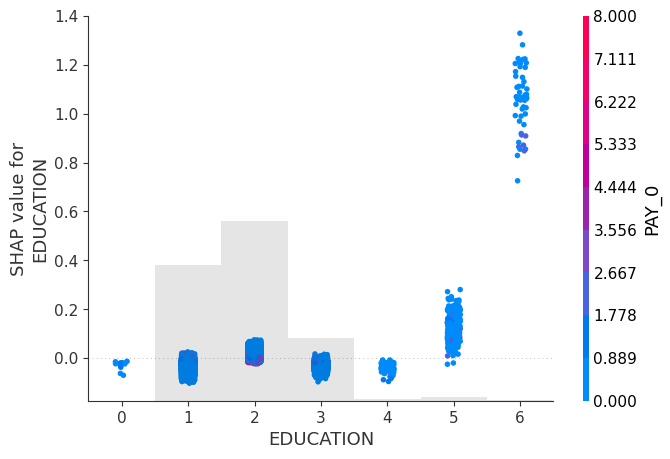

In [34]:
explainer = shap.Explainer(lgbm_model, proc_data.to_numpy(), feature_names=feature_names)
shap_values = explainer(proc_data.to_numpy())
shap.plots.scatter(shap_values[:,"EDUCATION"], color=shap_values)